In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import numpy as np
import pandas as pd
from tqdm import tqdm
from glob import glob
from keras.layers import *
from keras.models import *
from keras.utils import *
import numpy as np
import os

In [3]:
normal = np.load('/content/drive/MyDrive/covxnet_data/train_Normal_128.npy')
viral = np.load('/content/drive/MyDrive/covxnet_data/train_Virus_128.npy')
bacterial = np.load('/content/drive/MyDrive/covxnet_data/train_bacteria_128.npy')

In [4]:
normal.shape, viral.shape, bacterial.shape

((1341, 128, 128, 1), (1345, 128, 128, 1), (2530, 128, 128, 1))

In [5]:
label_normal = np.zeros(len(normal))
label_bacterial = np.ones(len(bacterial))
label_viral = np.full(len(viral),2, dtype = int)

In [6]:
train_data = np.concatenate((normal,bacterial,viral),axis=0)
train_label = np.concatenate((label_normal,label_bacterial,label_viral),axis=0)

In [7]:
train_label.shape, train_data.shape

((5216,), (5216, 128, 128, 1))

In [8]:
import matplotlib.pyplot as plt

100%|██████████| 3/3 [00:00<00:00, 163.67it/s]


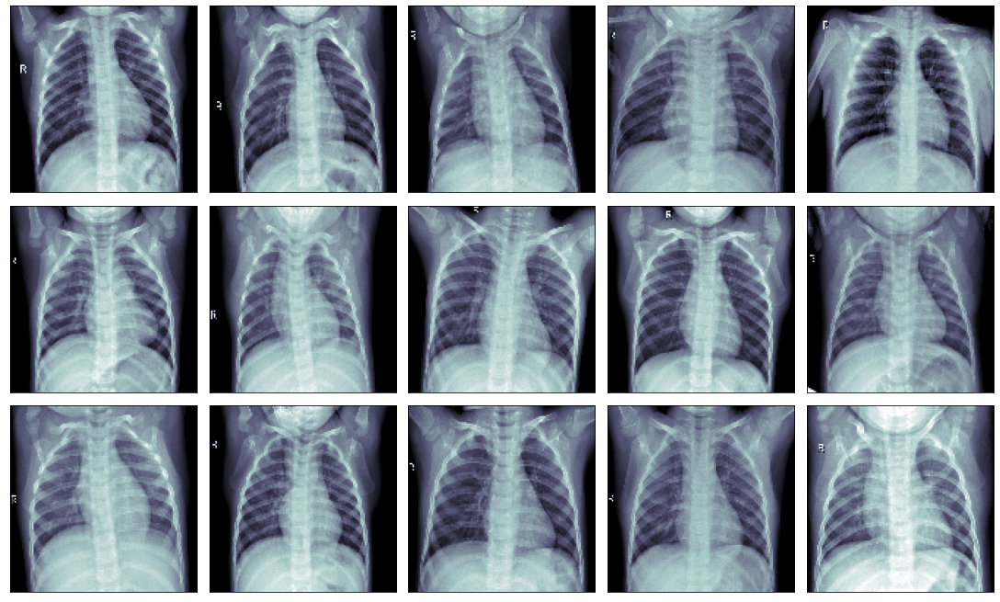

In [9]:
n_row = 3
n_col = 5

fig, ax = plt.subplots(n_row, n_col, figsize = (n_col*3, n_row*3), constrained_layout = True)

for row in tqdm(range(n_row)):
    
    for col in range(n_col):
        
        ax[row][col].imshow(normal[row*n_col + col,:,:,0], cmap = 'bone')
        ax[row][col].set_xticks([])
        ax[row][col].set_yticks([])

100%|██████████| 3/3 [00:00<00:00, 165.23it/s]


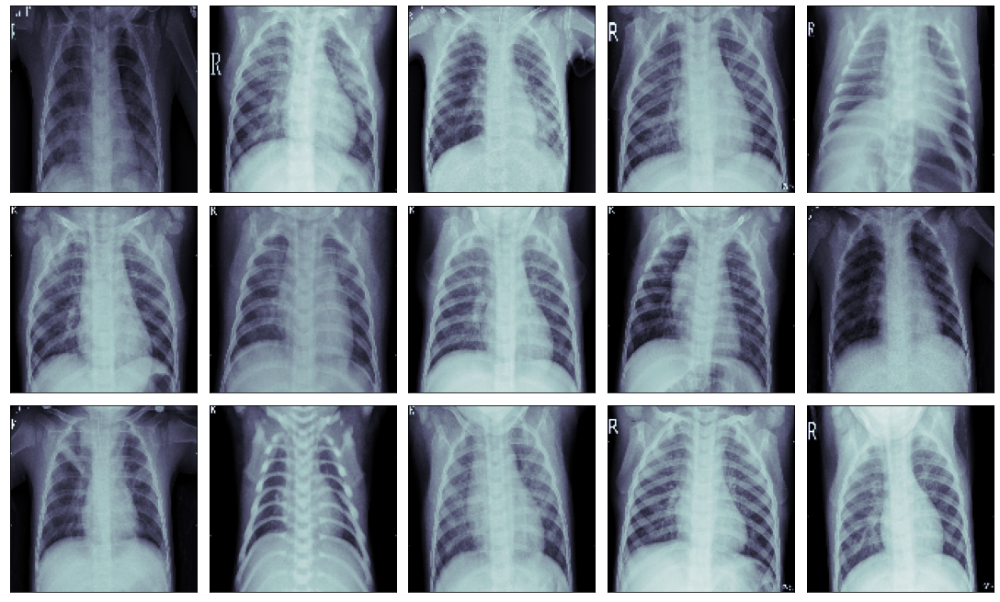

In [10]:
n_row = 3
n_col = 5

fig, ax = plt.subplots(n_row, n_col, figsize = (n_col*3, n_row*3), constrained_layout = True)

for row in tqdm(range(n_row)):
    
    for col in range(n_col):
        
        ax[row][col].imshow(viral[row*n_col + col,:,:,0], cmap = 'bone')
        ax[row][col].set_xticks([])
        ax[row][col].set_yticks([])

100%|██████████| 3/3 [00:00<00:00, 159.02it/s]


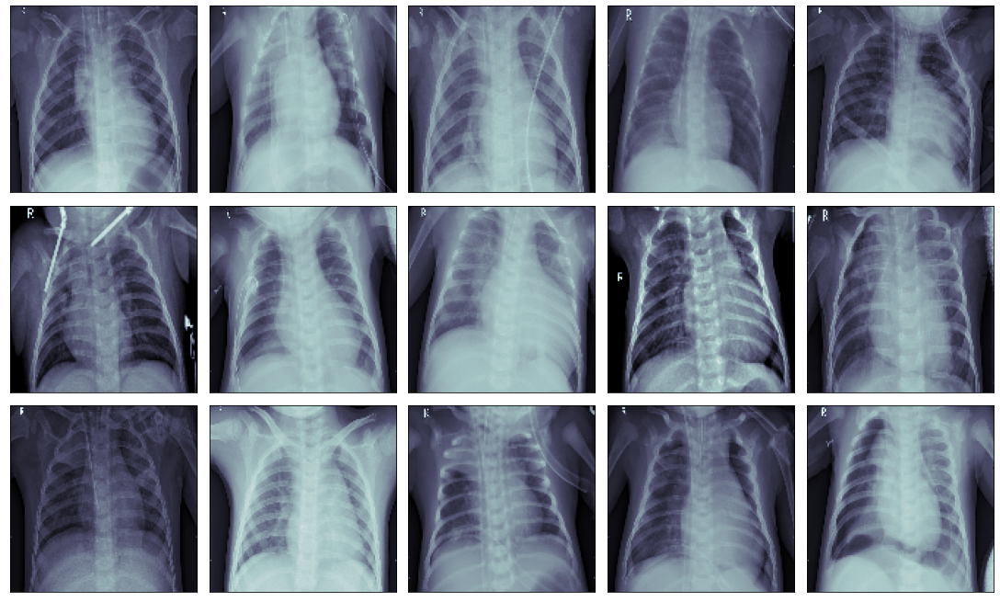

In [11]:
n_row = 3
n_col = 5

fig, ax = plt.subplots(n_row, n_col, figsize = (n_col*3, n_row*3), constrained_layout = True)

for row in tqdm(range(n_row)):
    
    for col in range(n_col):
        
        ax[row][col].imshow(bacterial[row*n_col + col,:,:,0], cmap = 'bone')
        ax[row][col].set_xticks([])
        ax[row][col].set_yticks([])

In [12]:
test_normal = np.load('/content/drive/MyDrive/covxnet_data/test_Normal_128.npy')
test_viral = np.load('/content/drive/MyDrive/covxnet_data/test_Virus_128.npy')
test_bacterial = np.load('/content/drive/MyDrive/covxnet_data/test_bacteria_128.npy')

In [13]:
test_normal.shape, test_viral.shape , test_bacterial.shape

((234, 128, 128, 1), (148, 128, 128, 1), (242, 128, 128, 1))

In [14]:
label_test_normal = np.zeros(len(test_normal))
label_test_bacterial = np.ones(len(test_bacterial))
label_test_viral = np.full(len(test_viral),2, dtype = int)

In [15]:
test_data = np.concatenate((test_normal, test_bacterial, test_viral),axis=0)
test_label = np.concatenate((label_test_normal,label_test_bacterial,label_test_viral),axis=0)

In [16]:
test_data.shape

(624, 128, 128, 1)

100%|██████████| 3/3 [00:00<00:00, 140.14it/s]
/usr/local/lib/python3.7/dist-packages/google/colab/_event_manager.py:28: UserWarning: Casting input data from 'float128' to 'float64' for imshow
  func(*args, **kwargs)
/usr/local/lib/python3.7/dist-packages/IPython/core/pylabtools.py:125: UserWarning: Casting input data from 'float128' to 'float64' for imshow
  fig.canvas.print_figure(bytes_io, **kw)


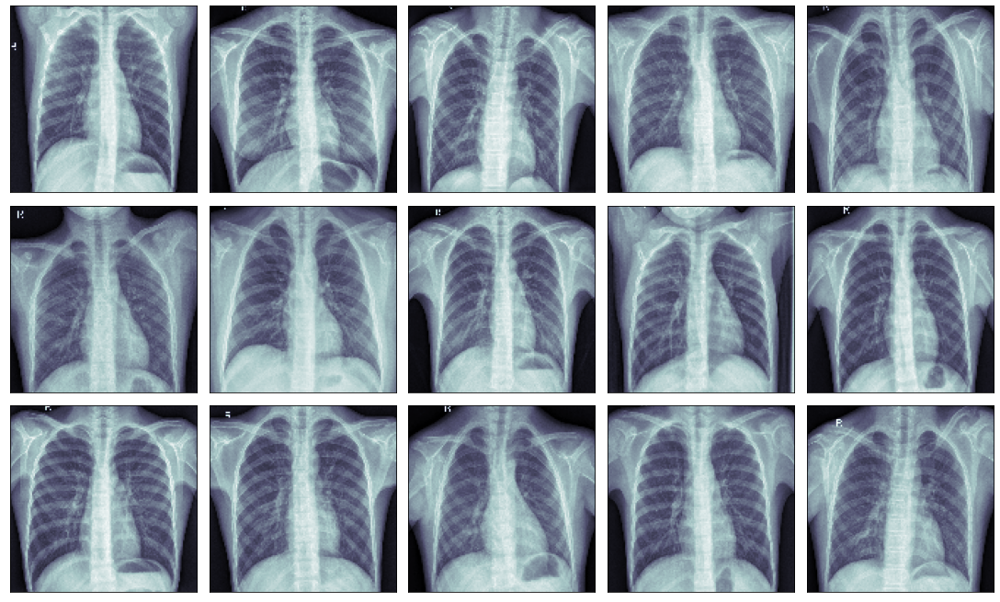

In [17]:
n_row = 3
n_col = 5

fig, ax = plt.subplots(n_row, n_col, figsize = (n_col*3, n_row*3), constrained_layout = True)

for row in tqdm(range(n_row)):
    
    for col in range(n_col):
        
        ax[row][col].imshow(test_normal[row*n_col + col,:,:,0], cmap = 'bone')
        ax[row][col].set_xticks([])
        ax[row][col].set_yticks([])

100%|██████████| 3/3 [00:00<00:00, 140.39it/s]


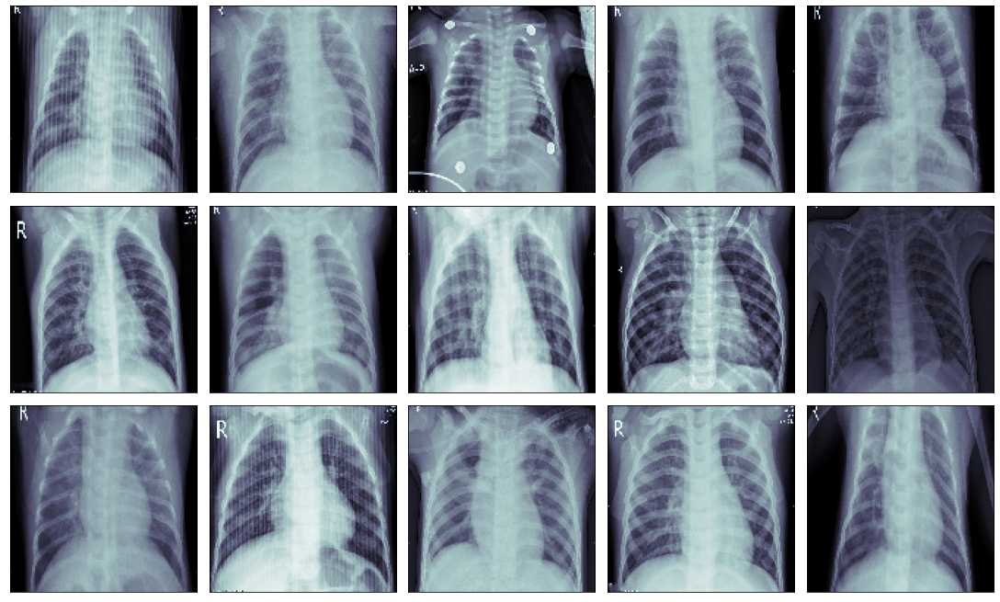

In [18]:
n_row = 3
n_col = 5

fig, ax = plt.subplots(n_row, n_col, figsize = (n_col*3, n_row*3), constrained_layout = True)

for row in tqdm(range(n_row)):
    
    for col in range(n_col):
        
        ax[row][col].imshow(test_viral[row*n_col + col,:,:,0], cmap = 'bone')
        ax[row][col].set_xticks([])
        ax[row][col].set_yticks([])

100%|██████████| 3/3 [00:00<00:00, 124.01it/s]


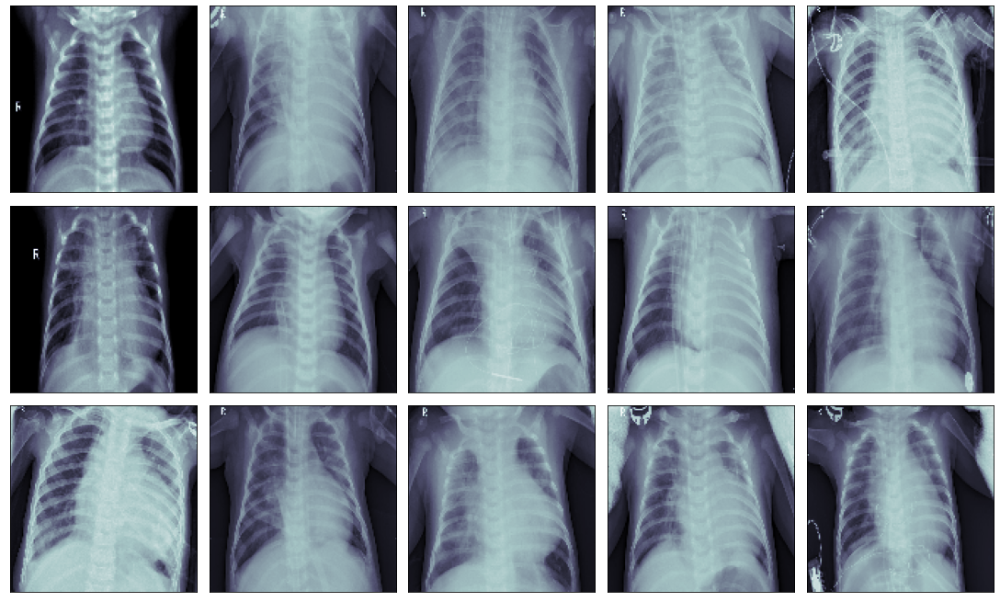

In [19]:
n_row = 3
n_col = 5

fig, ax = plt.subplots(n_row, n_col, figsize = (n_col*3, n_row*3), constrained_layout = True)

for row in tqdm(range(n_row)):
    
    for col in range(n_col):
        
        ax[row][col].imshow(test_bacterial[row*n_col + col,:,:,0], cmap = 'bone')
        ax[row][col].set_xticks([])
        ax[row][col].set_yticks([])

In [20]:
from sklearn.utils import class_weight
from numpy import array 
 
class_weights = class_weight.compute_class_weight('balanced',
                                                 np.unique(train_label),
                                                 train_label)
class_weights

array([1.29654487, 0.68722003, 1.29268897])

In [21]:
def Residual_Unit(input_tensor, nb_of_input_channels, max_dilation, number_of_units):
    
  for i in range(number_of_units):
    x1 = Conv2D(nb_of_input_channels*2, kernel_size = (1,1), strides = (1,1), padding='same', dilation_rate= (1,1), activation='relu')(input_tensor)
    x1 = BatchNormalization()(x1)
  
    a = []

    for i in range(1, max_dilation+1):
      temp = DepthwiseConv2D( kernel_size=(3,3), dilation_rate = (i,i), padding = 'same', activation= 'relu')(x1)
      temp = BatchNormalization()(temp)
      a.append(temp)

    x = Concatenate(axis= -1)(a)
    x = Conv2D(nb_of_input_channels, kernel_size = (1,1), strides = (1,1), padding='same', dilation_rate= (1,1), activation='relu')(x)
    x = BatchNormalization()(x)

    x = Add()([x, input_tensor])

    input_tensor = x
  
  return x


In [22]:
def Shifter_Unit(input_tensor, nb_of_input_channels, max_dilation):
    x1 = Conv2D(nb_of_input_channels*4, kernel_size = (1,1), strides = (1,1), padding='same', dilation_rate= (1,1), activation='relu')(input_tensor)
    x1 = BatchNormalization()(x1)

    a = []

    for i in range(1, max_dilation+1):
      temp = DepthwiseConv2D( kernel_size=(3,3), dilation_rate = (i,i), padding = 'same', activation= 'relu')(x1)
      temp = MaxPool2D(pool_size=(2,2))(temp)
      temp = BatchNormalization()(temp)
      a.append(temp)

    x = Concatenate(axis= -1)(a)

    x = Conv2D(nb_of_input_channels*2, kernel_size = (1,1), strides = (1,1), padding='same', dilation_rate= (1,1), activation='relu')(x)
    x = BatchNormalization()(x)

    return x

In [24]:
from tensorflow.keras.optimizers import Adam

In [25]:
#Network:
  
def Network128(input_shape, nb_class, depth):
  xin = Input(shape= input_shape)

  x = Conv2D(16, kernel_size = (5,5), strides= (1,1), padding = 'same', activation='relu')(xin)
  x = BatchNormalization()(x)

  x = Conv2D(32, kernel_size = (3,3), strides= (2,2), padding = 'same', activation='relu')(x)
  x = BatchNormalization()(x)
  
##Max Dilation rate will be vary in the range (1,5). 

# Max Dilation rate is 5 for tensor (64x64x32)
  x = Residual_Unit(input_tensor=x, nb_of_input_channels=32, max_dilation=5, number_of_units=depth)
  x = Shifter_Unit(input_tensor=x, nb_of_input_channels=32, max_dilation=5)


# Max Dilation rate is 4 for (32x32x64)
  x = Residual_Unit(input_tensor=x, nb_of_input_channels=64, max_dilation=4, number_of_units=depth)
  x = Shifter_Unit(input_tensor=x, nb_of_input_channels=64, max_dilation=4)

# Max Dilation rate is 3 for (16x16x128)
  x = Residual_Unit(input_tensor=x, nb_of_input_channels=128, max_dilation=3, number_of_units=depth)
  x = Shifter_Unit(input_tensor=x, nb_of_input_channels=128, max_dilation=3)

# Max Dilation rate is 2 for (8x8x256)
  x = Residual_Unit(input_tensor=x, nb_of_input_channels=256, max_dilation=2, number_of_units=depth)
  x = Shifter_Unit(input_tensor=x, nb_of_input_channels=256, max_dilation=2)

  x = GlobalAveragePooling2D()(x)

  x = Dense(128, activation='relu')(x)
  x = Dense(64, activation='relu')(x)

  x = Dense(nb_class, activation= 'softmax')(x)

  model = Model(xin, x)

  model.compile(loss='categorical_crossentropy', optimizer = Adam(lr = 1e-3), metrics = ['accuracy'])

  return model

In [26]:
# plot confusion matrix

import itertools
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import pandas.util.testing as tm
from sklearn import metrics
import seaborn as sns
sns.set()

plt.rcParams["font.family"] = 'DejaVu Sans'

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues,
                          save = False):
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=90)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.grid(b=False)
    if save == True:
      plt.savefig('Confusion Matrix.png', dpi = 900)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import sys


In [27]:
# test model performance
from datetime import datetime
import matplotlib.pyplot as plt


def test_model(model, test_generator, y_test, class_labels, cm_normalize=True, \
                 print_cm=True):
    
    # BS = 16
    results = dict()
    
    # n = len(testy)// BS

    # testX = testX[:BS*n]
    # testy = testy[:BS*n]

    print('Predicting test data')
    test_start_time = datetime.now()
    y_pred_original = model.predict_generator(test_generator,verbose=1)
    # y_pred = (y_pred_original>0.5).astype('int')

    y_pred = np.argmax(y_pred_original, axis = 1)
    # y_test = np.argmax(testy, axis= 1)
    #y_test = np.argmax(testy, axis=-1)
    
    test_end_time = datetime.now()
    print('Done \n \n')
    results['testing_time'] = test_end_time - test_start_time
    print('testing time(HH:MM:SS:ms) - {}\n\n'.format(results['testing_time']))
    results['predicted'] = y_pred
    y_test = y_test.astype(int) # sparse form not categorical
    

    # balanced_accuracy
    from sklearn.metrics import balanced_accuracy_score
    balanced_accuracy = balanced_accuracy_score(y_true=y_test, y_pred=y_pred)
    print('---------------------')
    print('| Balanced Accuracy  |')
    print('---------------------')
    print('\n    {}\n\n'.format(balanced_accuracy))

    
    # calculate overall accuracty of the model
    accuracy = metrics.accuracy_score(y_true=y_test, y_pred=y_pred)
    # store accuracy in results
    results['accuracy'] = accuracy
    print('---------------------')
    print('|      Accuracy      |')
    print('---------------------')
    print('\n    {}\n\n'.format(accuracy))
    

    # get classification report
    print('-------------------------')
    print('| Classifiction Report |')
    print('-------------------------')
    classification_report = metrics.classification_report(y_test, y_pred)
    # store report in results
    results['classification_report'] = classification_report
    print(classification_report)
    
    
    
    # confusion matrix
    cm = metrics.confusion_matrix(y_test, y_pred)
    results['confusion_matrix'] = cm
    if print_cm: 
        print('--------------------')
        print('| Confusion Matrix |')
        print('--------------------')
        print('\n {}'.format(cm))
        
    # plot confusin matrix
    plt.figure(figsize=(6,4))
    plt.grid(b=False)
    plot_confusion_matrix(cm, classes=class_labels, normalize=True, title='Normalized confusion matrix')
    plt.show()
    

    
    # add the trained  model to the results
    results['model'] = model
    
    return


from keras.callbacks import Callback
class MyLogger(Callback):
  
  def __init__(self, test_generator, y_test, class_labels):
    super(MyLogger, self).__init__()
    self.test_generator = test_generator
    self.y_test = y_test
    self.class_labels = class_labels
    
  def on_epoch_end(self, epoch, logs=None):
    test_model(self.model, self.test_generator, self.y_test, self.class_labels)

In [29]:
from tensorflow.keras.utils import to_categorical
train_label = to_categorical(train_label, num_classes= 3)
test_label  = to_categorical(test_label, num_classes = 3)

In [40]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.models import load_model
from tensorflow.keras.callbacks import *


train_datagen = ImageDataGenerator(rescale = 1/255,
                                  width_shift_range = 0.1,
                                  height_shift_range = 0.1,
                                  fill_mode = 'constant',
                                  zoom_range = 0.2,
                                  rotation_range = 30)

val_datagen = ImageDataGenerator(rescale = 1/255)

train_generator = train_datagen.flow(train_data,
                                     train_label, 
                                     batch_size = 16, 
                                     shuffle = True)

val_generator = val_datagen.flow(test_data,
                                 test_label,
                                 batch_size = 16,
                                 shuffle = False)

In [41]:
images, labels = train_generator.next()

100%|██████████| 3/3 [00:00<00:00, 161.98it/s]


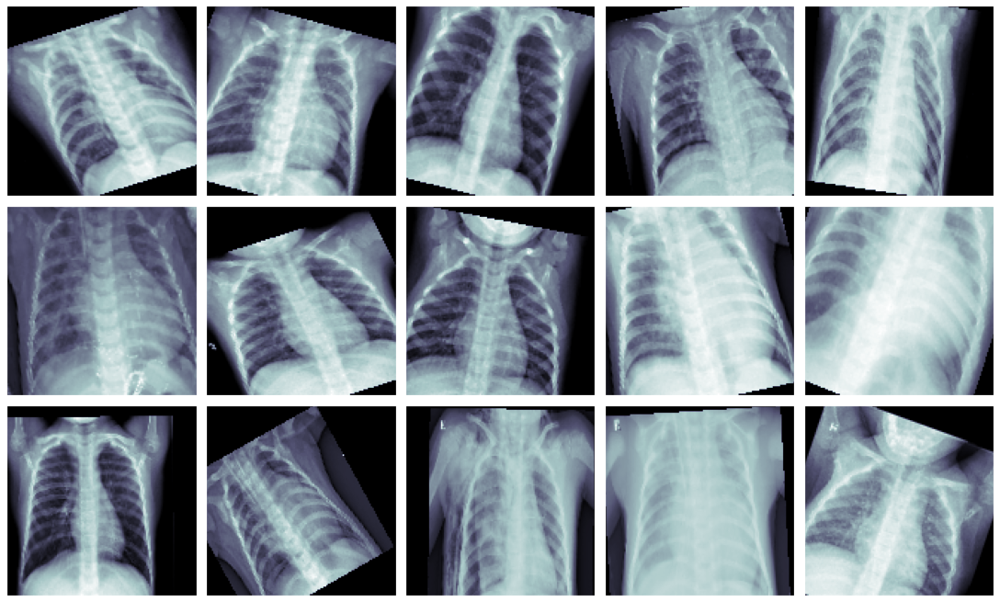

In [32]:
n_row = 3
n_col = 5

fig, ax = plt.subplots(n_row, n_col, figsize = (n_col*3, n_row*3), constrained_layout = True)

for row in tqdm(range(n_row)):
    
    for col in range(n_col):
        
        ax[row][col].imshow(images[row*n_col + col,:,:,0], cmap = 'bone')
        ax[row][col].set_xticks([])
        ax[row][col].set_yticks([])

In [33]:
os.mkdir('Model')
os.mkdir('History')

In [34]:
def get_callbacks():
    
    filepath = 'Model/best_model_multiclass_128.h5'
    callback1 = ModelCheckpoint(filepath, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')
    callback2 = MyLogger(val_generator, 
                         y_test = np.argmax(test_label, axis = 1),
                         class_labels = ['Normal', 'Viral', 'Bacterial'])
    
    callback3 = CSVLogger('History/Multiclass_Log_128.csv')

    return [callback1 ,callback2, callback3]

In [35]:
model = Network128(input_shape = (128, 128, 1), nb_class = 3, depth = 5)
model.summary() 

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 128, 128, 1  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 128, 128, 16  416         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 128, 128, 16  64         ['conv2d[0][0]']                 
 alization)                     )                                                             

In [36]:
import keras
import pydot
import pydotplus
from pydotplus import graphviz
from keras.utils.vis_utils import plot_model
from keras.utils.vis_utils import model_to_dot
keras.utils.vis_utils.pydot = pydot

plot_model(model, show_shapes=True)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  


Epoch 1/30
326/326 [==============================] - ETA: 0s - loss: 0.8234 - accuracy: 0.6246
Epoch 00001: val_accuracy improved from -inf to 0.38782, saving model to Model/best_model_multiclass_128.h5


/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


Predicting test data


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.


39/39 [==============================] - 14s 274ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:14.151193


---------------------
| Balanced Accuracy  |
---------------------

    0.3333333333333333


---------------------
|      Accuracy      |
---------------------

    0.38782051282051283


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       234
           1       0.39      1.00      0.56       242
           2       0.00      0.00      0.00       148

    accuracy                           0.39       624
   macro avg       0.13      0.33      0.19       624
weighted avg       0.15      0.39      0.22       624

--------------------
| Confusion Matrix |
--------------------

 [[  0 234   0]
 [  0 242   0]
 [  0 148   0]]


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


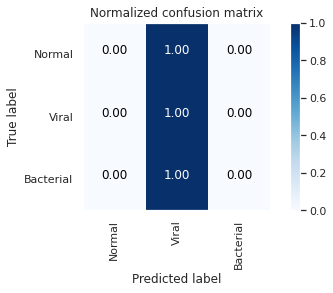

326/326 [==============================] - 439s 1s/step - loss: 0.8234 - accuracy: 0.6246 - val_loss: 1.8364 - val_accuracy: 0.3878
Epoch 2/30
326/326 [==============================] - ETA: 0s - loss: 0.7063 - accuracy: 0.6906
Epoch 00002: val_accuracy did not improve from 0.38782
Predicting test data
39/39 [==============================] - 10s 274ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:10.773013


---------------------
| Balanced Accuracy  |
---------------------

    0.3333333333333333


---------------------
|      Accuracy      |
---------------------

    0.38782051282051283


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       234
           1       0.39      1.00      0.57       242
           2       0.00      0.00      0.00       148

    accuracy                           0.39       624
   macro avg       0.13      0.33      0.19       

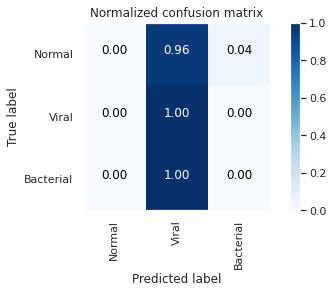

326/326 [==============================] - 378s 1s/step - loss: 0.7063 - accuracy: 0.6906 - val_loss: 1.7502 - val_accuracy: 0.3878
Epoch 3/30
326/326 [==============================] - ETA: 0s - loss: 0.6570 - accuracy: 0.7097
Epoch 00003: val_accuracy improved from 0.38782 to 0.70833, saving model to Model/best_model_multiclass_128.h5
Predicting test data
39/39 [==============================] - 11s 275ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:10.802583


---------------------
| Balanced Accuracy  |
---------------------

    0.6768208131844496


---------------------
|      Accuracy      |
---------------------

    0.7083333333333334


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.64      0.93      0.76       234
           1       0.90      0.65      0.76       242
           2       0.61      0.45      0.52       148

    accuracy                           0.71      

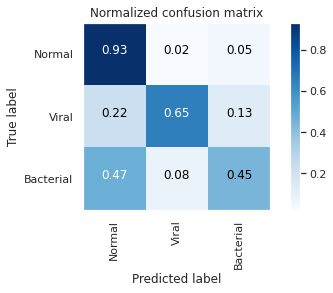

326/326 [==============================] - 380s 1s/step - loss: 0.6570 - accuracy: 0.7097 - val_loss: 0.7315 - val_accuracy: 0.7083
Epoch 4/30
326/326 [==============================] - ETA: 0s - loss: 0.6374 - accuracy: 0.7308
Epoch 00004: val_accuracy improved from 0.70833 to 0.76442, saving model to Model/best_model_multiclass_128.h5
Predicting test data
39/39 [==============================] - 11s 276ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:10.852912


---------------------
| Balanced Accuracy  |
---------------------

    0.7328566646748466


---------------------
|      Accuracy      |
---------------------

    0.7644230769230769


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.74      0.93      0.82       234
           1       0.86      0.76      0.81       242
           2       0.65      0.51      0.57       148

    accuracy                           0.76      

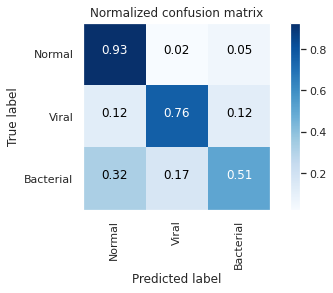

326/326 [==============================] - 381s 1s/step - loss: 0.6374 - accuracy: 0.7308 - val_loss: 0.6753 - val_accuracy: 0.7644
Epoch 5/30
326/326 [==============================] - ETA: 0s - loss: 0.6155 - accuracy: 0.7316
Epoch 00005: val_accuracy did not improve from 0.76442
Predicting test data
39/39 [==============================] - 11s 275ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:10.810990


---------------------
| Balanced Accuracy  |
---------------------

    0.6607386152840699


---------------------
|      Accuracy      |
---------------------

    0.7323717948717948


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.76      0.93      0.84       234
           1       0.70      0.89      0.79       242
           2       0.75      0.16      0.27       148

    accuracy                           0.73       624
   macro avg       0.74      0.66      0.63       6

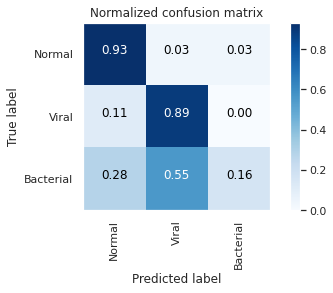

326/326 [==============================] - 377s 1s/step - loss: 0.6155 - accuracy: 0.7316 - val_loss: 0.7254 - val_accuracy: 0.7324
Epoch 6/30
326/326 [==============================] - ETA: 0s - loss: 0.5820 - accuracy: 0.7467
Epoch 00006: val_accuracy improved from 0.76442 to 0.80288, saving model to Model/best_model_multiclass_128.h5
Predicting test data
39/39 [==============================] - 11s 275ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:10.792272


---------------------
| Balanced Accuracy  |
---------------------

    0.7667223803587441


---------------------
|      Accuracy      |
---------------------

    0.8028846153846154


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.80      0.84      0.82       234
           1       0.81      0.94      0.87       242
           2       0.79      0.52      0.63       148

    accuracy                           0.80      

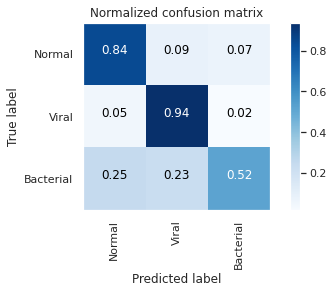

326/326 [==============================] - 380s 1s/step - loss: 0.5820 - accuracy: 0.7467 - val_loss: 0.5873 - val_accuracy: 0.8029
Epoch 7/30
326/326 [==============================] - ETA: 0s - loss: 0.5745 - accuracy: 0.7536
Epoch 00007: val_accuracy did not improve from 0.80288
Predicting test data
39/39 [==============================] - 11s 275ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:10.777936


---------------------
| Balanced Accuracy  |
---------------------

    0.7062302289575016


---------------------
|      Accuracy      |
---------------------

    0.7628205128205128


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.89      0.86      0.88       234
           1       0.68      0.94      0.79       242
           2       0.71      0.32      0.44       148

    accuracy                           0.76       624
   macro avg       0.76      0.71      0.70       6

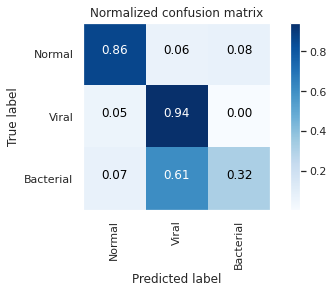

326/326 [==============================] - 383s 1s/step - loss: 0.5745 - accuracy: 0.7536 - val_loss: 0.5943 - val_accuracy: 0.7628
Epoch 8/30
326/326 [==============================] - ETA: 0s - loss: 0.5627 - accuracy: 0.7625
Epoch 00008: val_accuracy improved from 0.80288 to 0.82212, saving model to Model/best_model_multiclass_128.h5
Predicting test data
39/39 [==============================] - 11s 275ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:10.817943


---------------------
| Balanced Accuracy  |
---------------------

    0.7843145115872389


---------------------
|      Accuracy      |
---------------------

    0.8221153846153846


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.91      0.86      0.88       234
           1       0.76      0.97      0.85       242
           2       0.81      0.53      0.64       148

    accuracy                           0.82      

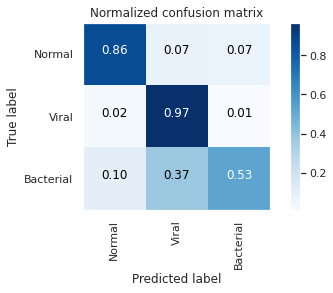

326/326 [==============================] - 385s 1s/step - loss: 0.5627 - accuracy: 0.7625 - val_loss: 0.4838 - val_accuracy: 0.8221
Epoch 9/30
326/326 [==============================] - ETA: 0s - loss: 0.5456 - accuracy: 0.7659
Epoch 00009: val_accuracy improved from 0.82212 to 0.83173, saving model to Model/best_model_multiclass_128.h5
Predicting test data
39/39 [==============================] - 11s 275ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:20.516679


---------------------
| Balanced Accuracy  |
---------------------

    0.817007567007567


---------------------
|      Accuracy      |
---------------------

    0.8317307692307693


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.93      0.77      0.84       234
           1       0.80      0.95      0.87       242
           2       0.76      0.72      0.74       148

    accuracy                           0.83       

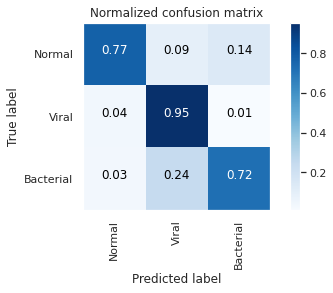

326/326 [==============================] - 396s 1s/step - loss: 0.5456 - accuracy: 0.7659 - val_loss: 0.5917 - val_accuracy: 0.8317
Epoch 10/30
326/326 [==============================] - ETA: 0s - loss: 0.5509 - accuracy: 0.7734
Epoch 00010: val_accuracy improved from 0.83173 to 0.86699, saving model to Model/best_model_multiclass_128.h5
Predicting test data
39/39 [==============================] - 11s 275ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:20.521726


---------------------
| Balanced Accuracy  |
---------------------

    0.8567653794926523


---------------------
|      Accuracy      |
---------------------

    0.8669871794871795


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.93      0.84      0.88       234
           1       0.88      0.94      0.91       242
           2       0.75      0.79      0.77       148

    accuracy                           0.87     

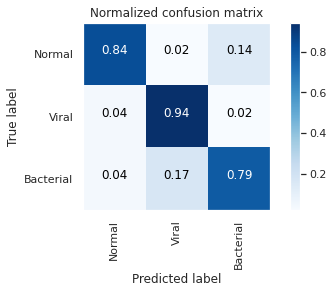

326/326 [==============================] - 395s 1s/step - loss: 0.5509 - accuracy: 0.7734 - val_loss: 0.5002 - val_accuracy: 0.8670
Epoch 11/30
326/326 [==============================] - ETA: 0s - loss: 0.5360 - accuracy: 0.7719
Epoch 00011: val_accuracy did not improve from 0.86699
Predicting test data
39/39 [==============================] - 11s 275ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:10.805087


---------------------
| Balanced Accuracy  |
---------------------

    0.7925396789033153


---------------------
|      Accuracy      |
---------------------

    0.8157051282051282


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.75      0.91      0.82       234
           1       0.90      0.83      0.87       242
           2       0.81      0.63      0.71       148

    accuracy                           0.82       624
   macro avg       0.82      0.79      0.80       

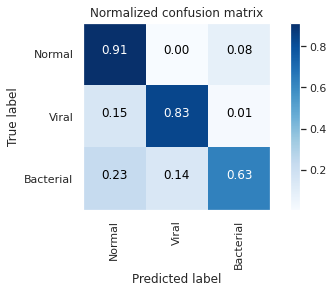

326/326 [==============================] - 384s 1s/step - loss: 0.5360 - accuracy: 0.7719 - val_loss: 0.5997 - val_accuracy: 0.8157
Epoch 12/30
326/326 [==============================] - ETA: 0s - loss: 0.5296 - accuracy: 0.7768
Epoch 00012: val_accuracy did not improve from 0.86699
Predicting test data
39/39 [==============================] - 11s 275ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:10.797383


---------------------
| Balanced Accuracy  |
---------------------

    0.7941770441770442


---------------------
|      Accuracy      |
---------------------

    0.7948717948717948


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.97      0.62      0.76       234
           1       0.78      0.95      0.86       242
           2       0.68      0.80      0.73       148

    accuracy                           0.79       624
   macro avg       0.81      0.79      0.78       

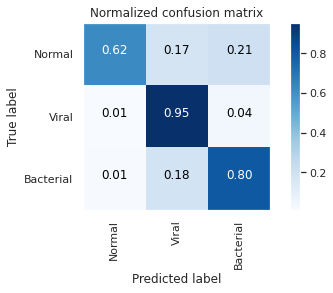

326/326 [==============================] - 384s 1s/step - loss: 0.5296 - accuracy: 0.7768 - val_loss: 0.7531 - val_accuracy: 0.7949
Epoch 13/30
326/326 [==============================] - ETA: 0s - loss: 0.5193 - accuracy: 0.7747
Epoch 00013: val_accuracy did not improve from 0.86699
Predicting test data
39/39 [==============================] - 11s 276ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:10.831403


---------------------
| Balanced Accuracy  |
---------------------

    0.8021658021658022


---------------------
|      Accuracy      |
---------------------

    0.8141025641025641


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.93      0.72      0.81       234
           1       0.76      0.95      0.85       242
           2       0.78      0.73      0.75       148

    accuracy                           0.81       624
   macro avg       0.82      0.80      0.80       

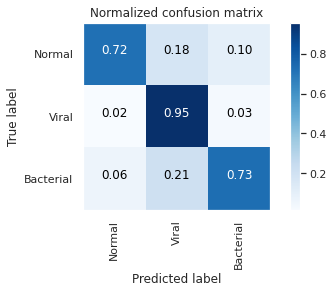

326/326 [==============================] - 384s 1s/step - loss: 0.5193 - accuracy: 0.7747 - val_loss: 0.5976 - val_accuracy: 0.8141
Epoch 14/30
326/326 [==============================] - ETA: 0s - loss: 0.5273 - accuracy: 0.7757
Epoch 00014: val_accuracy did not improve from 0.86699
Predicting test data
39/39 [==============================] - 11s 275ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:10.809958


---------------------
| Balanced Accuracy  |
---------------------

    0.7706576570212933


---------------------
|      Accuracy      |
---------------------

    0.8189102564102564


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.82      0.90      0.86       234
           1       0.80      0.97      0.88       242
           2       0.88      0.44      0.59       148

    accuracy                           0.82       624
   macro avg       0.83      0.77      0.77       

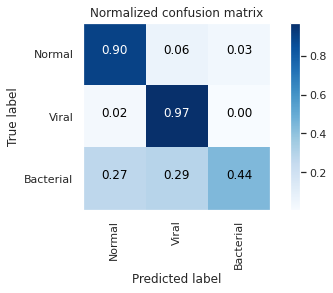

326/326 [==============================] - 385s 1s/step - loss: 0.5273 - accuracy: 0.7757 - val_loss: 0.4794 - val_accuracy: 0.8189
Epoch 15/30
326/326 [==============================] - ETA: 0s - loss: 0.5170 - accuracy: 0.7816
Epoch 00015: val_accuracy did not improve from 0.86699
Predicting test data
39/39 [==============================] - 11s 275ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:10.804309


---------------------
| Balanced Accuracy  |
---------------------

    0.847031392485938


---------------------
|      Accuracy      |
---------------------

    0.8493589743589743


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.94      0.77      0.85       234
           1       0.87      0.93      0.90       242
           2       0.72      0.84      0.77       148

    accuracy                           0.85       624
   macro avg       0.84      0.85      0.84       6

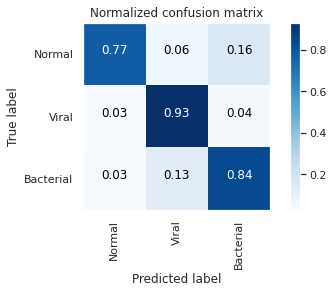

326/326 [==============================] - 382s 1s/step - loss: 0.5170 - accuracy: 0.7816 - val_loss: 0.4941 - val_accuracy: 0.8494
Epoch 16/30
326/326 [==============================] - ETA: 0s - loss: 0.5011 - accuracy: 0.7874
Epoch 00016: val_accuracy did not improve from 0.86699
Predicting test data
39/39 [==============================] - 11s 275ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:10.798182


---------------------
| Balanced Accuracy  |
---------------------

    0.8318988091715364


---------------------
|      Accuracy      |
---------------------

    0.8573717948717948


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.85      0.92      0.88       234
           1       0.88      0.92      0.90       242
           2       0.83      0.66      0.73       148

    accuracy                           0.86       624
   macro avg       0.85      0.83      0.84       

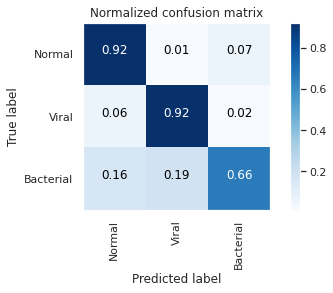

326/326 [==============================] - 384s 1s/step - loss: 0.5011 - accuracy: 0.7874 - val_loss: 0.4955 - val_accuracy: 0.8574
Epoch 17/30
326/326 [==============================] - ETA: 0s - loss: 0.5137 - accuracy: 0.7776
Epoch 00017: val_accuracy did not improve from 0.86699
Predicting test data
39/39 [==============================] - 11s 275ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:10.797085


---------------------
| Balanced Accuracy  |
---------------------

    0.8146067236976328


---------------------
|      Accuracy      |
---------------------

    0.8301282051282052


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.75      0.92      0.83       234
           1       0.93      0.82      0.87       242
           2       0.84      0.70      0.76       148

    accuracy                           0.83       624
   macro avg       0.84      0.81      0.82       

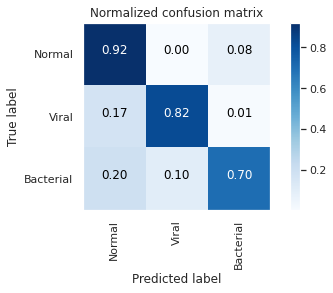

326/326 [==============================] - 384s 1s/step - loss: 0.5137 - accuracy: 0.7776 - val_loss: 0.6541 - val_accuracy: 0.8301
Epoch 18/30
326/326 [==============================] - ETA: 0s - loss: 0.5121 - accuracy: 0.7789
Epoch 00018: val_accuracy did not improve from 0.86699
Predicting test data
39/39 [==============================] - 11s 275ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:10.788297


---------------------
| Balanced Accuracy  |
---------------------

    0.7976382294564113


---------------------
|      Accuracy      |
---------------------

    0.7980769230769231


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.95      0.69      0.80       234
           1       0.88      0.90      0.89       242
           2       0.57      0.80      0.67       148

    accuracy                           0.80       624
   macro avg       0.80      0.80      0.79       

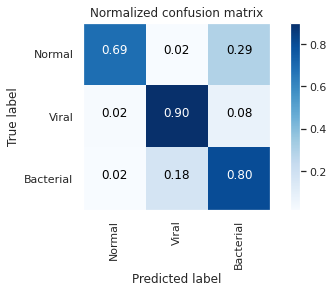

326/326 [==============================] - 384s 1s/step - loss: 0.5121 - accuracy: 0.7789 - val_loss: 0.7164 - val_accuracy: 0.7981
Epoch 19/30
326/326 [==============================] - ETA: 0s - loss: 0.4990 - accuracy: 0.7841
Epoch 00019: val_accuracy did not improve from 0.86699
Predicting test data
39/39 [==============================] - 11s 277ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:10.875414


---------------------
| Balanced Accuracy  |
---------------------

    0.8240942786397332


---------------------
|      Accuracy      |
---------------------

    0.8509615384615384


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.82      0.95      0.88       234
           1       0.91      0.89      0.90       242
           2       0.80      0.64      0.71       148

    accuracy                           0.85       624
   macro avg       0.84      0.82      0.83       

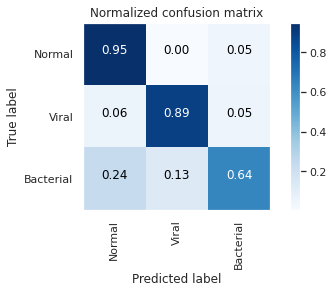

326/326 [==============================] - 384s 1s/step - loss: 0.4990 - accuracy: 0.7841 - val_loss: 0.4573 - val_accuracy: 0.8510
Epoch 20/30
326/326 [==============================] - ETA: 0s - loss: 0.4895 - accuracy: 0.7885
Epoch 00020: val_accuracy did not improve from 0.86699
Predicting test data
39/39 [==============================] - 11s 277ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:10.872917


---------------------
| Balanced Accuracy  |
---------------------

    0.8526376026376026


---------------------
|      Accuracy      |
---------------------

    0.8637820512820513


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.89      0.87      0.88       234
           1       0.88      0.91      0.90       242
           2       0.78      0.78      0.78       148

    accuracy                           0.86       624
   macro avg       0.85      0.85      0.85       

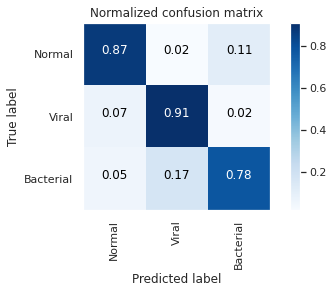

326/326 [==============================] - 386s 1s/step - loss: 0.4895 - accuracy: 0.7885 - val_loss: 0.4533 - val_accuracy: 0.8638
Epoch 21/30
326/326 [==============================] - ETA: 0s - loss: 0.4922 - accuracy: 0.7891
Epoch 00021: val_accuracy did not improve from 0.86699
Predicting test data
39/39 [==============================] - 11s 277ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:20.521250


---------------------
| Balanced Accuracy  |
---------------------

    0.813106654015745


---------------------
|      Accuracy      |
---------------------

    0.8397435897435898


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.82      0.91      0.86       234
           1       0.88      0.90      0.89       242
           2       0.79      0.63      0.70       148

    accuracy                           0.84       624
   macro avg       0.83      0.81      0.82       6

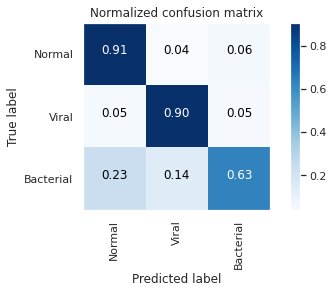

326/326 [==============================] - 396s 1s/step - loss: 0.4922 - accuracy: 0.7891 - val_loss: 0.5055 - val_accuracy: 0.8397
Epoch 22/30
326/326 [==============================] - ETA: 0s - loss: 0.4918 - accuracy: 0.7857
Epoch 00022: val_accuracy did not improve from 0.86699
Predicting test data
39/39 [==============================] - 11s 277ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:10.863590


---------------------
| Balanced Accuracy  |
---------------------

    0.8296187159823525


---------------------
|      Accuracy      |
---------------------

    0.8269230769230769


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.97      0.71      0.82       234
           1       0.86      0.93      0.89       242
           2       0.65      0.86      0.74       148

    accuracy                           0.83       624
   macro avg       0.83      0.83      0.82       

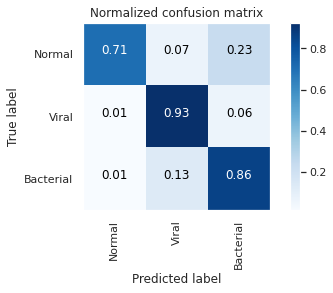

326/326 [==============================] - 385s 1s/step - loss: 0.4918 - accuracy: 0.7857 - val_loss: 0.6558 - val_accuracy: 0.8269
Epoch 23/30
326/326 [==============================] - ETA: 0s - loss: 0.4917 - accuracy: 0.7899
Epoch 00023: val_accuracy did not improve from 0.86699
Predicting test data
39/39 [==============================] - 11s 277ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:10.869364


---------------------
| Balanced Accuracy  |
---------------------

    0.8318964228055137


---------------------
|      Accuracy      |
---------------------

    0.8493589743589743


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.92      0.83      0.87       234
           1       0.84      0.95      0.89       242
           2       0.76      0.72      0.74       148

    accuracy                           0.85       624
   macro avg       0.84      0.83      0.83       

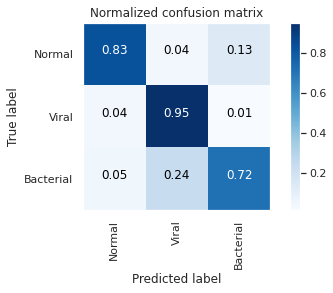

326/326 [==============================] - 385s 1s/step - loss: 0.4917 - accuracy: 0.7899 - val_loss: 0.4387 - val_accuracy: 0.8494
Epoch 24/30
326/326 [==============================] - ETA: 0s - loss: 0.4863 - accuracy: 0.7895
Epoch 00024: val_accuracy did not improve from 0.86699
Predicting test data
39/39 [==============================] - 11s 277ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:10.874036


---------------------
| Balanced Accuracy  |
---------------------

    0.7784776193867103


---------------------
|      Accuracy      |
---------------------

    0.8237179487179487


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.80      0.92      0.85       234
           1       0.84      0.95      0.89       242
           2       0.86      0.47      0.61       148

    accuracy                           0.82       624
   macro avg       0.83      0.78      0.78       

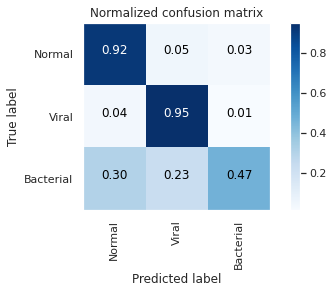

326/326 [==============================] - 385s 1s/step - loss: 0.4863 - accuracy: 0.7895 - val_loss: 0.4711 - val_accuracy: 0.8237
Epoch 25/30
326/326 [==============================] - ETA: 0s - loss: 0.4678 - accuracy: 0.7995
Epoch 00025: val_accuracy did not improve from 0.86699
Predicting test data
39/39 [==============================] - 11s 277ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:10.872730


---------------------
| Balanced Accuracy  |
---------------------

    0.837002132456678


---------------------
|      Accuracy      |
---------------------

    0.8557692307692307


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.87      0.87      0.87       234
           1       0.86      0.93      0.89       242
           2       0.82      0.71      0.76       148

    accuracy                           0.86       624
   macro avg       0.85      0.84      0.84       6

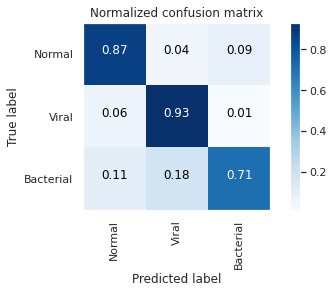

326/326 [==============================] - 386s 1s/step - loss: 0.4678 - accuracy: 0.7995 - val_loss: 0.5011 - val_accuracy: 0.8558
Epoch 26/30
326/326 [==============================] - ETA: 0s - loss: 0.4848 - accuracy: 0.7903
Epoch 00026: val_accuracy did not improve from 0.86699
Predicting test data
39/39 [==============================] - 11s 277ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:10.868982


---------------------
| Balanced Accuracy  |
---------------------

    0.6114191114191114


---------------------
|      Accuracy      |
---------------------

    0.6522435897435898


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.98      0.48      0.65       234
           1       0.54      1.00      0.70       242
           2       0.87      0.35      0.50       148

    accuracy                           0.65       624
   macro avg       0.80      0.61      0.62       

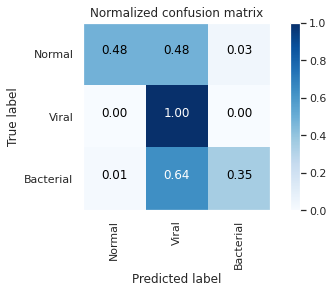

326/326 [==============================] - 385s 1s/step - loss: 0.4848 - accuracy: 0.7903 - val_loss: 1.0684 - val_accuracy: 0.6522
Epoch 27/30
326/326 [==============================] - ETA: 0s - loss: 0.4868 - accuracy: 0.7885
Epoch 00027: val_accuracy improved from 0.86699 to 0.87660, saving model to Model/best_model_multiclass_128.h5
Predicting test data
39/39 [==============================] - 11s 277ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:10.863448


---------------------
| Balanced Accuracy  |
---------------------

    0.8632529541620451


---------------------
|      Accuracy      |
---------------------

    0.8766025641025641


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.90      0.91      0.91       234
           1       0.89      0.90      0.90       242
           2       0.81      0.77      0.79       148

    accuracy                           0.88     

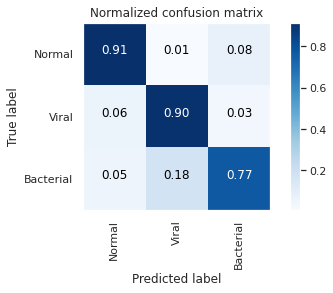

326/326 [==============================] - 385s 1s/step - loss: 0.4868 - accuracy: 0.7885 - val_loss: 0.4200 - val_accuracy: 0.8766
Epoch 28/30
326/326 [==============================] - ETA: 0s - loss: 0.4716 - accuracy: 0.7947
Epoch 00028: val_accuracy did not improve from 0.87660
Predicting test data
39/39 [==============================] - 11s 277ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:10.868721


---------------------
| Balanced Accuracy  |
---------------------

    0.8131701313519496


---------------------
|      Accuracy      |
---------------------

    0.8125


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.82      0.89      0.86       234
           1       0.94      0.74      0.82       242
           2       0.67      0.81      0.73       148

    accuracy                           0.81       624
   macro avg       0.81      0.81      0.80       624
weighted

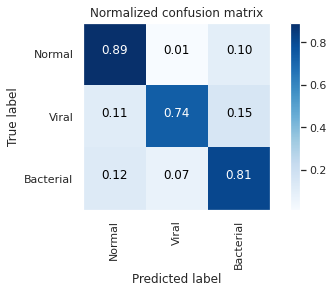

326/326 [==============================] - 382s 1s/step - loss: 0.4716 - accuracy: 0.7947 - val_loss: 0.4938 - val_accuracy: 0.8125
Epoch 29/30
326/326 [==============================] - ETA: 0s - loss: 0.4677 - accuracy: 0.7945
Epoch 00029: val_accuracy did not improve from 0.87660
Predicting test data
39/39 [==============================] - 11s 275ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:10.789988


---------------------
| Balanced Accuracy  |
---------------------

    0.7789268925632561


---------------------
|      Accuracy      |
---------------------

    0.7756410256410257


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.96      0.58      0.72       234
           1       0.84      0.94      0.89       242
           2       0.57      0.82      0.67       148

    accuracy                           0.78       624
   macro avg       0.79      0.78      0.76       

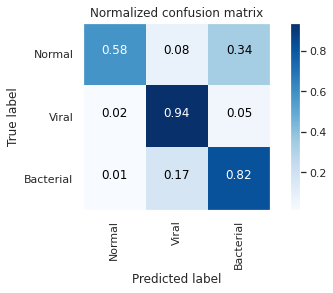

326/326 [==============================] - 387s 1s/step - loss: 0.4677 - accuracy: 0.7945 - val_loss: 0.6205 - val_accuracy: 0.7756
Epoch 30/30
326/326 [==============================] - ETA: 0s - loss: 0.4651 - accuracy: 0.7991
Epoch 00030: val_accuracy did not improve from 0.87660
Predicting test data
39/39 [==============================] - 11s 275ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:11.207207


---------------------
| Balanced Accuracy  |
---------------------

    0.8328929692566055


---------------------
|      Accuracy      |
---------------------

    0.8637820512820513


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.87      0.91      0.89       234
           1       0.87      0.97      0.92       242
           2       0.84      0.62      0.71       148

    accuracy                           0.86       624
   macro avg       0.86      0.83      0.84       

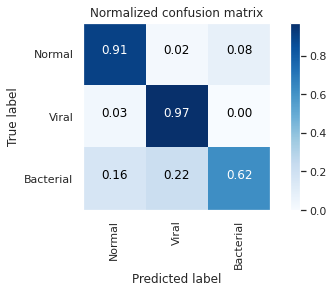

326/326 [==============================] - 387s 1s/step - loss: 0.4651 - accuracy: 0.7991 - val_loss: 0.4145 - val_accuracy: 0.8638


In [43]:
history = model.fit_generator(train_generator,
                              steps_per_epoch = len(train_data) // 16,
                              validation_data=val_generator,
                              validation_steps= len(test_data)// 16,
                              epochs = 30,
                              callbacks = get_callbacks())

/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


Saved model to disk
INFO:tensorflow:Assets written to: CNN_covX.model/assets


/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)
/usr/local/lib/python3.7/dist-packages/keras/saving/saved_model/layer_serialization.py:112: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  return generic_utils.serialize_keras_object(obj)


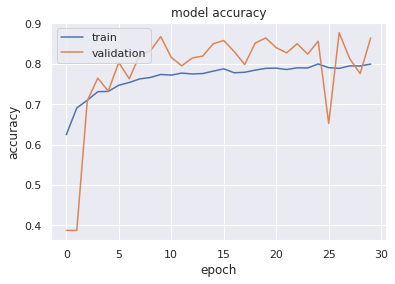

In [44]:

# Saving the model
model_json = model.to_json()
with open("model.json", "w") as json_file :
	json_file.write(model_json)

model.save_weights("covX_model.h5")
print("Saved model to disk")



#********************************************
model.save('CNN_covX.model')

# Printing a graph showing the accuracy changes during the training phase
#print(history.history.keys())

# dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


plt.figure(1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')



In [45]:
from keras.models import load_model
best_model = load_model('Model/best_model_multiclass_128.h5')

Predicting test data


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.


39/39 [==============================] - 14s 279ms/step
Done 
 

testing time(HH:MM:SS:ms) - 0:00:14.571330


---------------------
| Balanced Accuracy  |
---------------------

    0.8632529541620451


---------------------
|      Accuracy      |
---------------------

    0.8766025641025641


-------------------------
| Classifiction Report |
-------------------------
              precision    recall  f1-score   support

           0       0.90      0.91      0.91       234
           1       0.89      0.90      0.90       242
           2       0.81      0.77      0.79       148

    accuracy                           0.88       624
   macro avg       0.87      0.86      0.87       624
weighted avg       0.88      0.88      0.88       624

--------------------
| Confusion Matrix |
--------------------

 [[214   2  18]
 [ 15 219   8]
 [  8  26 114]]


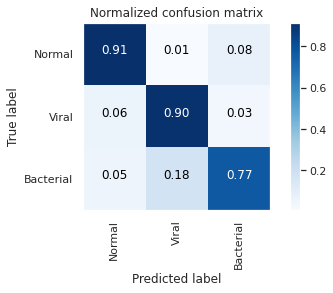

In [46]:
#validation_data=val_generator
test_model(best_model, 
           val_generator,
           y_test = np.argmax(test_label, axis = 1),
           class_labels = ['Normal', 'Viral', 'Bacterial'])

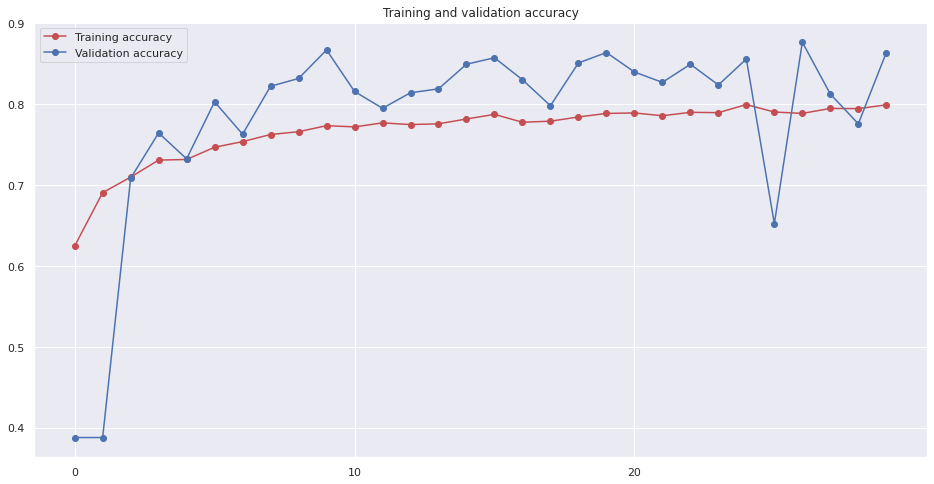

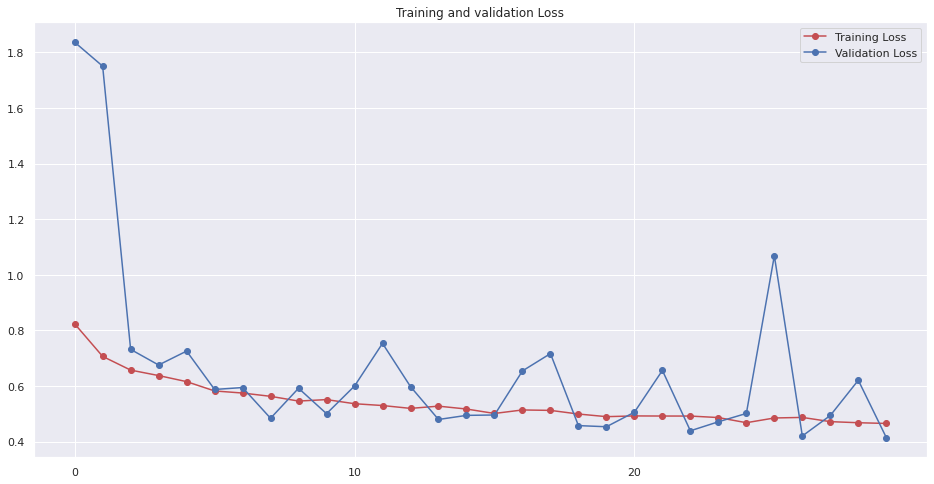

<Figure size 432x288 with 0 Axes>

In [47]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
acc = model.history.history['accuracy']
val_acc = model.history.history['val_accuracy']
loss = model.history.history['loss']
val_loss = model.history.history['val_loss']

epochs = range(0,len(acc))
fig = plt.gcf()
fig.set_size_inches(16, 8)

plt.plot(epochs, acc, 'r', label='Training accuracy',marker = "o")
plt.plot(epochs, val_acc, 'b', label='Validation accuracy',marker = "o")
plt.title('Training and validation accuracy')
plt.xticks(np.arange(0, len(acc), 10))
plt.legend(loc=0)
plt.figure()

fig = plt.gcf()
fig.set_size_inches(16, 8)
plt.plot(epochs, loss, 'r', label='Training Loss',marker = "o")
plt.plot(epochs, val_loss, 'b', label='Validation Loss',marker = "o")
plt.title('Training and validation Loss')
plt.xticks(np.arange(0, len(acc), 10))
plt.legend(loc=0)
#plt.savefig('Multiclass Model .png')
plt.figure()
plt.show()
